In [17]:
## Lets import our requirements
import boto3
import pandas as pd
#import psycopg2
import pymysql
from sqlalchemy import create_engine
import os
import sqlite3
import sys
parentDirectory = os.path.abspath(os.path.join(os.getcwd(), os.pardir))
sys.path.insert(0,parentDirectory)
from secretsPaul import secrets
import mysql.connector
import plotly.express as px


In [9]:
#connections
#def create_connection():
endpoint = 'drown-murphy-lankheet.cluster-ceswqg9qwa9i.us-east-1.rds.amazonaws.com'#secrets.get('DATABASE_ENDPOINT')
user = secrets.get('DATABASE_USER')
password = secrets.get('DATABASE_PASSWORD')
port=secrets.get('DATABASE_PORT')
connection = create_engine(f'mysql+pymysql://{user}:{password}@{endpoint}:{port}/Capstone', pool_recycle=3600,  connect_args={'connect_timeout': 10});
    
connect=mysql.connector.connect(host=endpoint, database='Capstone', user=user, password=password)
cursor = connect.cursor()
    #return cursor
#cursor=create_connection()

In [22]:
avail = pd.read_sql('Select availability_90 from listing_detail_stage where minimum_nights <=10 and availability_90  <> 0',connection) 

In [25]:
avail.boxplot()

<AxesSubplot:>

In [27]:
avail.describe()

,availability_90
count,611122.000000
mean,53.346515
std,27.208580
min,1.000000
25%,30.000000
50%,58.000000
75%,78.000000
max,90.000000


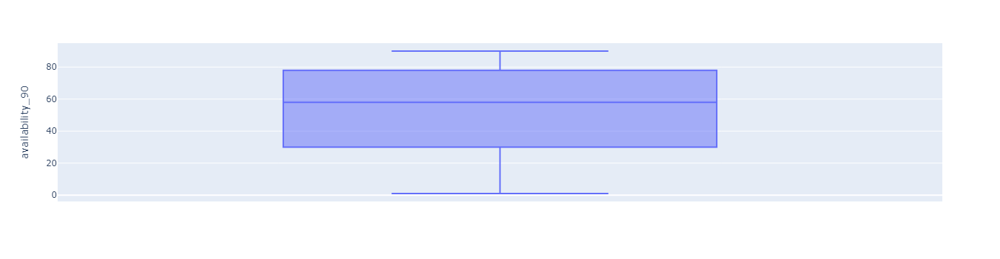

In [30]:
fig=px.box(avail, y='availability_90')
fig.show()